In [1]:
import anndata as ad
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import seaborn as sns
import matplotlib.colors as mcolors

In [2]:
fdata = sc.read_h5ad("./RNA/Multitime.clustered.h5")

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. 

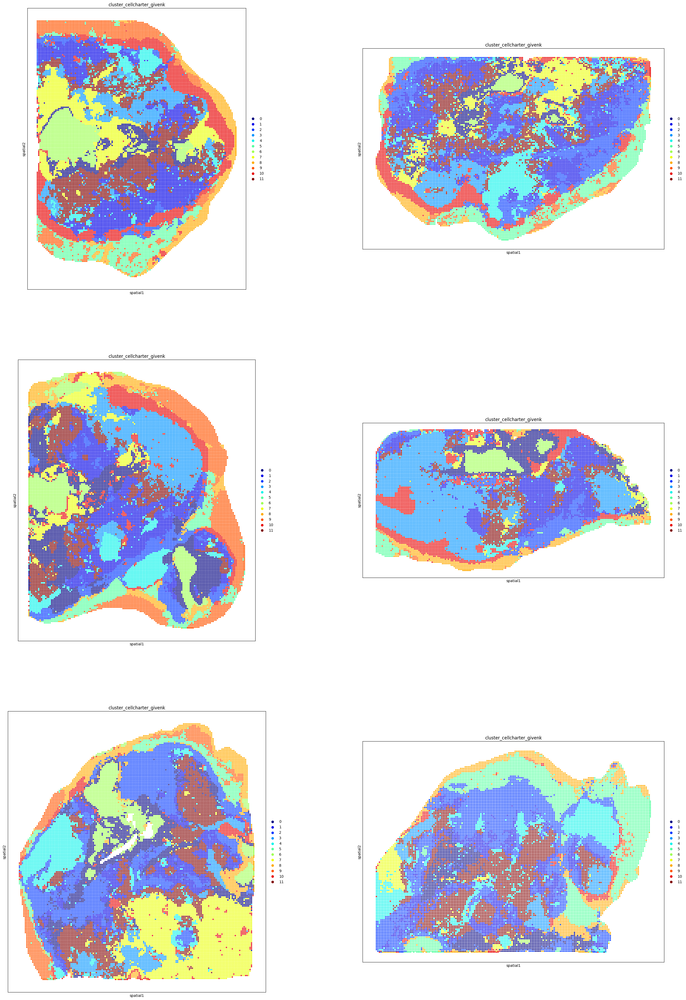

In [3]:
sq.pl.spatial_scatter(
    fdata, 
    color=['cluster_cellcharter_givenk'], 
    library_key='marker',  
    size=20, 
    img=None,
    spatial_key='spatial',
    palette='jet',
    #connectivity_key='spatial_connectivities',
    #img_alpha=0.3,
    figsize=(15,15),
    ncols=2,
    shape=None
)

In [72]:
fdata.X = fdata.layers["counts"]
sc.pp.normalize_total(fdata, exclude_highly_expressed=True)
sc.pp.filter_cells(fdata, min_counts=10)
sc.pp.filter_cells(fdata, min_genes=10)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


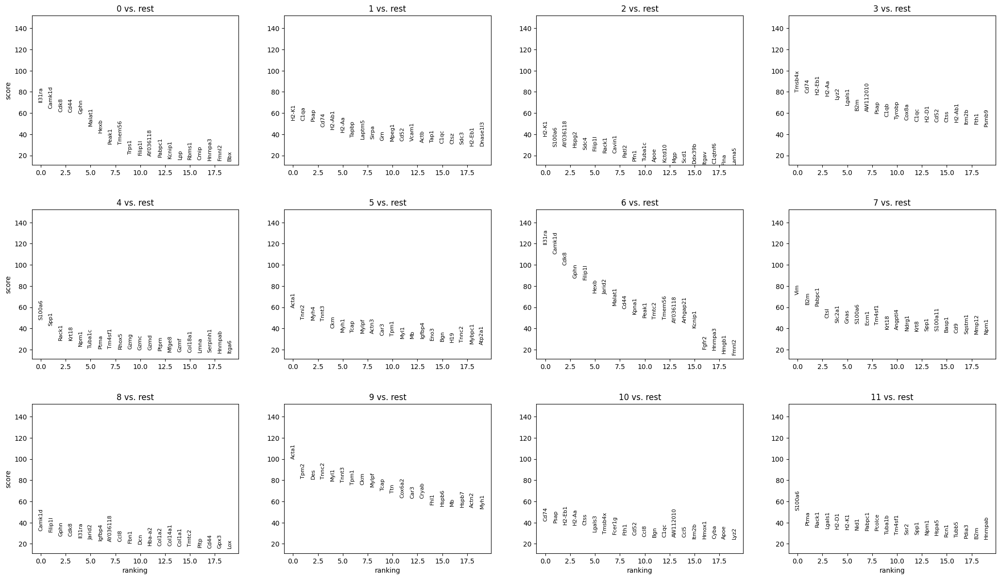

In [73]:
sc.tl.rank_genes_groups(fdata, groupby="cluster_cellcharter_givenk", method="t-test")
sc.pl.rank_genes_groups(fdata, n_genes=20)

In [5]:
pval_cutoff = 0.01
top_n = 50

result = fdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

top_genes_df = pd.DataFrame()

for group in groups:
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj,
        'score': score,
        'Cluster': group
    })
    
    filtered_data = data[data['padj'] < 0.01]
    sorted_data = filtered_data.sort_values(by='score', ascending=False)
    top_genes = sorted_data.head(top_n)
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv('DEG.csv', index=False, sep="\t")
top_genes_df

,Gene,Log2FoldChange,padj,score,Cluster
0,Il31ra,1.698707,0.000000e+00,45.774677,0
1,Cd44,1.405137,0.000000e+00,43.589825,0
2,Malat1,1.234776,0.000000e+00,42.706799,0
3,Hexb,0.913633,2.934200e-306,38.552090,0
4,Camk1d,1.695040,4.706520e-295,37.549950,0
...,...,...,...,...,...
2395,Rcc2,0.234920,1.597286e-37,13.050844,11
2396,Patz1,0.461876,2.042954e-37,13.041139,11
2397,Cxxc5,0.300682,2.714173e-37,13.014336,11
2398,Nudcd2,0.375864,4.427105e-37,12.979486,11


In [33]:
!sshpass -p wang2024 ssh wpy@172.16.10.103 "mamba run -n gsea python ~/stereoseq/20240502-SPACseq/enrich.py"

Gene               object
Log2FoldChange    float64
padj              float64
score             float64
Cluster             int64
dtype: object
/home/wpy/stereoseq/20240502-SPACseq/bin/go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
Enrichment analysis for list 0 completed successfully: 643
Enrichment analysis for list 1 completed successfully: 642
Enrichment analysis for list 2 completed successfully: 725
Enrichment analysis for list 3 completed successfully: 683
Enrichment analysis for list 4 completed successfully: 714
Enrichment analysis for list 5 completed successfully: 354
Enrichment analysis for list 6 completed successfully: 588
Enrichment analysis for list 7 completed successfully: 585
Enrichment analysis for list 8 completed successfully: 381
Enrichment analysis for list 9 completed successfully: 358
Enrichment analysis for list 10 completed successfully: 486
Enrichment analysis for list 11 completed successfully: 719



In [82]:
for i in range(12):
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False)
    results = results[results["Adjusted P-value"] < 0.1]
    results = results.loc[:, ["Term", "Genes", "Adjusted P-value"]]
    results["Cluster"] = i
    results["Gene Counts"] = results["Genes"].str.split(";").apply(len)
    results["Term"] = results["Term"].str.split("R-HSA").str[0]
    results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
    if not i: go_df = results
    else: go_df = pd.concat([go_df, results], axis=0)
go_df.to_csv('./GO/Reactome.csv', index=None, sep='\t')
go_df

/tmp/ipykernel_36717/16810321.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
/tmp/ipykernel_36717/16810321.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_ind

,Term,Genes,Adjusted P-value,Cluster,Gene Counts
0,Signal Transduction,GSK3B;DOCK4;MAML2;FAM13B;SH3KBP1;PDE3B;USP34;M...,0.000001,0,56
1,RHO GTPase Cycle,VAV3;DOCK4;ROCK1;FAM13B;DST;USP9X;PCDH7;ARAP2;...,0.000001,0,21
2,Signaling By Rho GTPases,VAV3;DOCK4;ROCK1;FAM13B;DST;USP9X;PCDH7;ARAP2;...,0.000117,0,22
3,"Signaling By Rho GTPases, Miro GTPases And RHO...",VAV3;DOCK4;ROCK1;FAM13B;DST;USP9X;PCDH7;ARAP2;...,0.000133,0,22
4,RAC1 GTPase Cycle,DOCK10;TIAM2;VAV3;ARHGAP21;DOCK4;DIAPH3;FAM13B...,0.000237,0,11
...,...,...,...,...,...
69,Interleukin-12 Signaling,GSTO1;HNRNPF;IL12RB1,0.093805,11,3
70,Depolymerisation Of Nuclear Lamina,CCNB1;CDK1,0.093805,11,2
71,Processive Synthesis On Lagging Strand,PCNA;LRIG1,0.093805,11,2
72,Mismatch Repair,PCNA;LRIG1,0.093805,11,2


/tmp/ipykernel_36717/2921700867.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(
/tmp/ipykernel_36717/2921700867.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(
/tmp/ipykernel_36717/2921700867.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(
/tmp/ipykernel_36717/2921700867.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(
/tmp/ipykernel_3

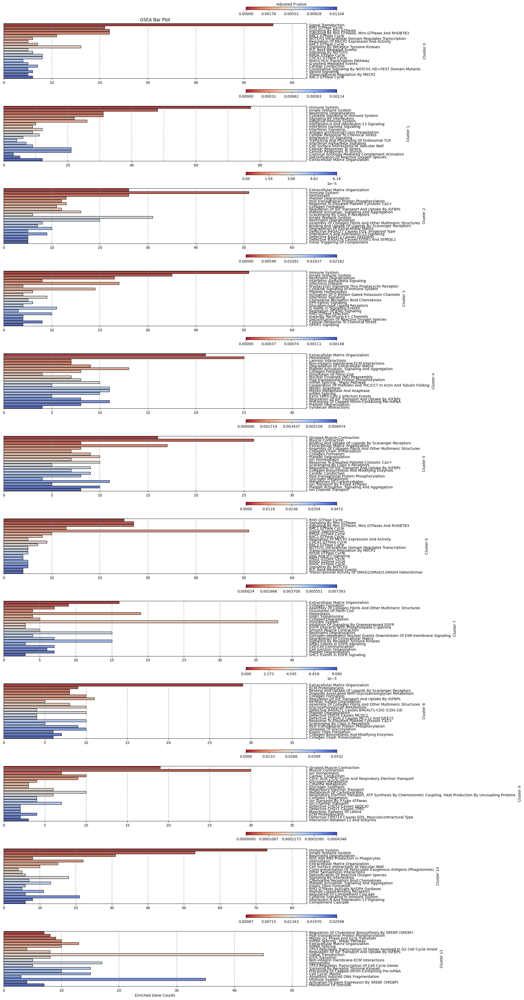

In [116]:
from matplotlib.ticker import FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(12, 1, figsize=(15, 48))
for cluster in range(12):
    gsea_results = go_df[go_df["Cluster"] == cluster][:20]

    barplot = sns.barplot(
        x='Gene Counts', 
        y='Term', 
        data=gsea_results, 
        palette="coolwarm_r",
        edgecolor='black',
        ax=ax[cluster]
    )
    for tick in ax[cluster].get_xticks():
        ax[cluster].axvline(x=tick, linestyle='--', color='gray', alpha=0.5)

    norm = plt.Normalize(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max())
    sm = plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm)
    sm.set_array([])
    cax = inset_axes(ax[cluster], width="30%", height="5%", loc='upper right',
                     bbox_to_anchor=(0.1, 0.3, 1, 1), bbox_transform=ax[cluster].transAxes, borderpad=0)
    if cluster == 0:
        cbar = fig.colorbar(sm, cax=cax, label="Adjusted P-value", orientation='horizontal', shrink=0.1)
        cbar.ax.xaxis.set_label_position('top')
    else: cbar = fig.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.1)

    cbar_ticks = np.linspace(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max(), num=5)  # Adjust num for density
    cbar.set_ticks(cbar_ticks)
    cbar.ax.yaxis.set_major_formatter(FormatStrFormatter('%.4f'))

    ax[cluster].yaxis.tick_right()
    ax[cluster].yaxis.set_label_position('right')

    ax[cluster].set_xlabel('')
    ax[cluster].set_ylabel(f'Cluster {cluster}')

plt.subplots_adjust(hspace=0.5)
ax[0].set_title('GSEA Bar Plot')
ax[11].set_xlabel('Enriched Gene Counts')
plt.show()

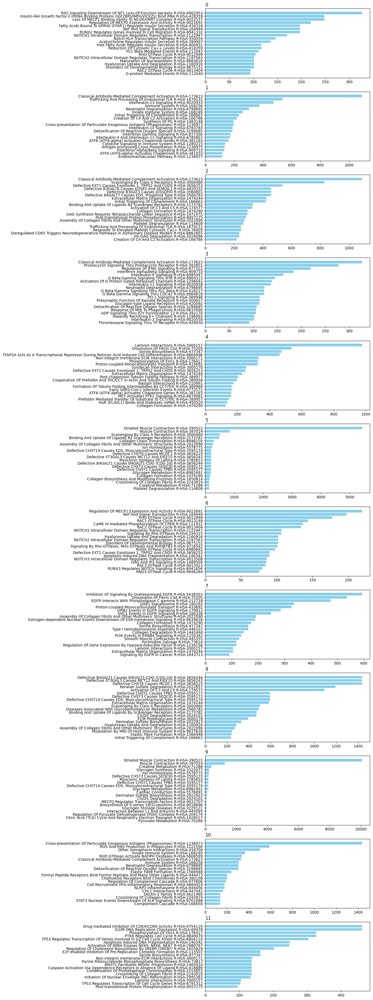

In [7]:
clusters = np.unique(go_df["Cluster"])
fig = plt.figure(figsize=(8, len(clusters) * 4))
for i in range(len(clusters)):
    ax = plt.subplot(len(clusters), 1, i+1)
    plt.title(f"{clusters[i]}", loc="left")
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False).head(20)

    ax.barh(results['Term'], results['Combined Score'], color='skyblue')

    plt.gca().invert_yaxis()

In [8]:
fdata.obs

,marker,n_genes,n_counts,_scvi_batch,_scvi_labels,cluster_cellcharter_givenk
12199,1-1,2001,5878,0,0,9
1102,1-1,2264,6028,0,0,5
15850,1-1,3547,12806,0,0,10
16761,1-1,2619,7236,0,0,9
565,1-1,2079,4818,0,0,1
...,...,...,...,...,...,...
2860-5,3-2,3,3,5,0,5
75-3,3-2,3,3,5,0,10
10270-4,3-2,3,3,5,0,10
17940-4,3-2,6,15,5,0,5


In [77]:
sc.pl.rank_genes_groups_matrixplot?

Signature:
sc.pl.rank_genes_groups_matrixplot(
    adata: anndata._core.anndata.AnnData,
    groups: Union[str, Sequence[str]] = None,
    n_genes: Optional[int] = None,
    groupby: Optional[str] = None,
    values_to_plot: Optional[Literal['scores', 'logfoldchanges', 'pvals', 'pvals_adj', 'log10_pvals', 'log10_pvals_adj']] = None,
    var_names: Union[Sequence[str], Mapping[str, Sequence[str]], NoneType] = None,
    gene_symbols: Optional[str] = None,
    min_logfoldchange: Optional[float] = None,
    key: Optional[str] = None,
    show: Optional[bool] = None,
    save: Optional[bool] = None,
    return_fig: Optional[bool] = False,
    **kwds,
)
Docstring:
Plot ranking of genes using matrixplot plot (see :func:`~scanpy.pl.matrixplot`)

Parameters
----------
adata
    Annotated data matrix.
groups
    The groups for which to show the gene ranking.
n_genes
    Number of genes to show. This can be a negative number to show for
    example the down regulated genes. eg: num_genes=-10. Is 

In [53]:
fdata.uns["rank_genes_groups"].keys()

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

In [113]:
gene_list = []
for value in gene_lists.values():
    gene_list += value

In [147]:
matrix_plot.get_axes()

{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'color_legend_ax': <Axes: title={'center': 'log fold change'}>}

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for

KeyError: "Could not find keys '['Actn2', 'Actn3', 'Car3', 'Col1a1', 'Col1a2', 'Cox6a2', 'Eno3', 'Fhl1', 'Grxcr1', 'Hspb6', 'Hspb7', 'Kcnip1', 'Lrrc75aos2', 'Mb', 'Pdlim3', 'Sfrp2', 'Vmn2r63']' in columns of `adata.obs` or in adata.var_names."

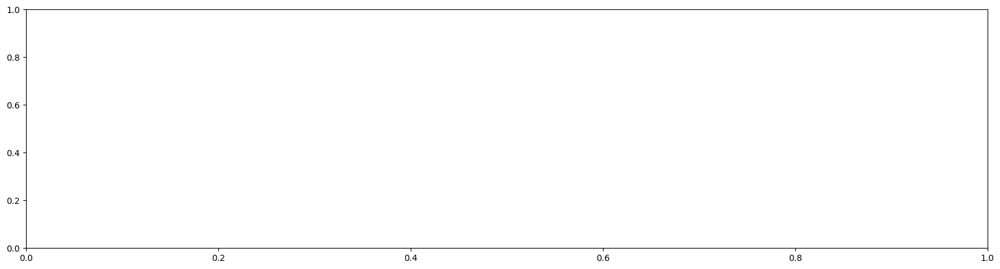

In [148]:
fig, ax = plt.subplots(figsize=(20, 5))
fdata.obs["cluster"] = fdata.obs["cluster_cellcharter_givenk"].astype(str).tolist()

rank_genes_groups = fdata.uns['rank_genes_groups']
groups = rank_genes_groups['names'].dtype.names

# Define P-value threshold and minimum logfoldchange
min_logfoldchange = 3
n_genes = 20

# Create a dataframe to store the top genes
top_genes = []

for group in groups:
    group_result = pd.DataFrame({
        'gene': rank_genes_groups['names'][group],
        'logfoldchanges': rank_genes_groups['logfoldchanges'][group]
    })
    
    # Filter by logfoldchange
    filtered_genes = group_result[group_result['logfoldchanges'] >= min_logfoldchange].sort_values('logfoldchanges', ascending=False).head(n_genes)
    
    filtered_genes['cluster'] = group
    top_genes.append(filtered_genes)

top_genes_df = pd.concat(top_genes)

# Get the unique genes
unique_genes = top_genes_df['gene'].unique()

# Subset the Anndata object to include only these genes
fdata_sub = fdata[:, unique_genes]

matrix_plot = sc.pl.rank_genes_groups_matrixplot(fdata_sub,
    groupby="cluster",
    #var_names=gene_list,
    values_to_plot="logfoldchanges",
    n_genes=20,
    ax=ax,
    vmax=10,

    vmin=-10,
    min_logfoldchange=3,
    return_fig=True
)
matrix_plot.get_axes()["color_legend_ax"].yaxis.set_label_position("right")

/tmp/ipykernel_36717/2385133007.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  expression_means = expression_df.groupby('cluster').mean()


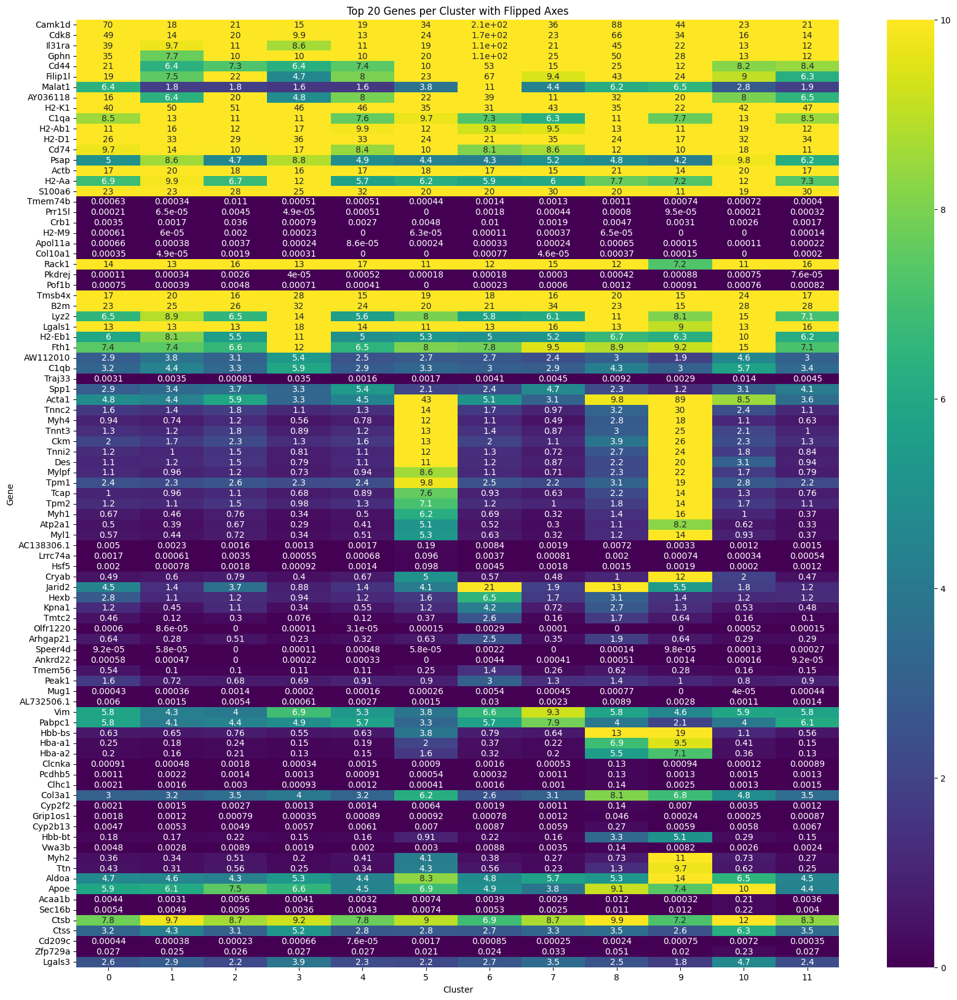

In [127]:
# Extract rank genes groups result
rank_genes_groups = fdata.uns['rank_genes_groups']
groups = rank_genes_groups['names'].dtype.names

# Define P-value threshold and minimum logfoldchange
min_logfoldchange = 3
n_genes = 20

# Create a dataframe to store the top genes
top_genes = []

for group in groups:
    group_result = pd.DataFrame({
        'gene': rank_genes_groups['names'][group],
        'logfoldchanges': rank_genes_groups['logfoldchanges'][group]
    })
    
    # Filter by logfoldchange
    filtered_genes = group_result[group_result['logfoldchanges'] >= min_logfoldchange].sort_values('logfoldchanges', ascending=False).head(n_genes)
    
    filtered_genes['cluster'] = group
    top_genes.append(filtered_genes)

top_genes_df = pd.concat(top_genes)

# Get the unique genes
unique_genes = top_genes_df['gene'].unique()

# Subset the Anndata object to include only these genes
fdata_sub = fdata[:, unique_genes]

# Create a dataframe for the expression values
expression_df = pd.DataFrame(fdata_sub.X.toarray(), index=fdata_sub.obs_names, columns=fdata_sub.var_names)
expression_df['cluster'] = fdata_sub.obs['cluster']

# Aggregate by cluster and calculate mean expression
expression_means = expression_df.groupby('cluster').mean()

# Transpose the data for flipped axes
expression_means_T = expression_means.T

# Plot the heatmap with Seaborn
plt.figure(figsize=(20, 20))
sns.heatmap(expression_means_T, cmap='viridis', vmax=10, vmin=0, annot=True)

plt.title('Top 20 Genes per Cluster with Flipped Axes')
plt.xlabel('Cluster')
plt.ylabel('Gene')
plt.show()

In [21]:
sc.pl.rank_genes_groups_dotplot?

Signature:
sc.pl.rank_genes_groups_dotplot(
    adata: anndata._core.anndata.AnnData,
    groups: Union[str, Sequence[str]] = None,
    n_genes: Optional[int] = None,
    groupby: Optional[str] = None,
    values_to_plot: Optional[Literal['scores', 'logfoldchanges', 'pvals', 'pvals_adj', 'log10_pvals', 'log10_pvals_adj']] = None,
    var_names: Union[Sequence[str], Mapping[str, Sequence[str]], NoneType] = None,
    gene_symbols: Optional[str] = None,
    min_logfoldchange: Optional[float] = None,
    key: Optional[str] = None,
    show: Optional[bool] = None,
    save: Optional[bool] = None,
    return_fig: Optional[bool] = False,
    **kwds,
)
Docstring:
Plot ranking of genes using dotplot plot (see :func:`~scanpy.pl.dotplot`)

Parameters
----------
adata
    Annotated data matrix.
groups
    The groups for which to show the gene ranking.
n_genes
    Number of genes to show. This can be a negative number to show for
    example the down regulated genes. eg: num_genes=-10. Is ignored i

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

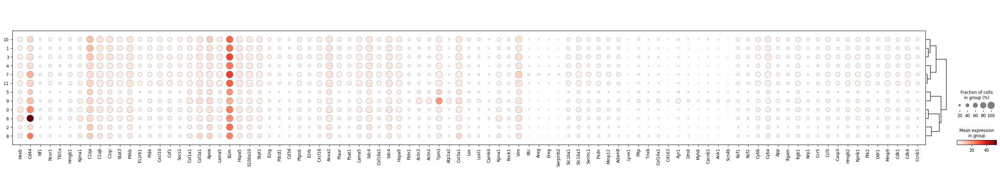

In [128]:
gene_lists = {
    '0': ['Hexb', 'Cd44', 'Nf1', 'Ncor1', 'Tbl1x', 'Hmgb1', 'Kpna1'],
    '1': ['C1qa', 'C1qb', 'C1qc', 'Stat3', 'P4hb', 'Il12rb1', 'Pld4', 'Cxcl10', 'Csf1', 'Socs1'],
    '2': ['Col1a1', 'Col3a1', 'col1a2', 'Apoe', 'Lama5', 'B2m', 'Hspa5', 'S100a10'],
    '3': ['Stat1', 'Il2rg', 'Pdcd1', 'Cd3d', 'Ptpn6', 'Il2rb', 'Cxcl16'],
    '4': ['Anxa2', 'Plaur', 'Psat1', 'Lama5', 'Sdc4', 'Col18a1', 'Sdc4', 'Hspa9', 'Fbln1'],
    '5': ['Actn3', 'Actn2', 'Tpm1', 'Atp1a2', 'Col3a1', 'Lox', 'Loxl1'],
    '6': ['Camk4', 'Kpna1', 'Rock1', 'Vim'],
    '7': ['Btc', 'Areg', 'Ereg', 'Serpinb2', 'Slc16a1', 'Slc16a3', 'Serinc1', 'Pxdn', 'Mmp12', 'Adam8'],
    '8': ['Lyve1', 'Pltp', 'Tnxb', 'Col14a1', 'Cd163'],
    '9': ['Ryr1', 'Dmd', 'Myh8', 'Cacnb1', 'Ank1', 'Scn4b'],
    '10': ['Ncf1', 'Ncf2', 'Cybb', 'Cyba', 'App', 'Itgam', 'Itgb1', 'Nrp1', 'Ccr5', 'Ccl5'],
    '11': ['Casp3', 'Hmgb2', 'Kpnb1', 'Ptk2', 'Ddr1', 'Mmp9', 'Cdk1', 'Cdk4', 'Ccnb1']
}

# 将所有基因列表合并为一个列表
all_genes = [gene for sublist in gene_lists.values() for gene in sublist]

# 检查基因是否在数据集中
available_genes = [gene for gene in all_genes if gene in fdata.var_names]

# 绘制气泡图
sc.pl.rank_genes_groups_dotplot(fdata, groupby="cluster_cellcharter_givenk", var_names=available_genes, show=True)

In [49]:
fdata.uns["rank_genes_groups"]['names']['0']

array(['Il31ra', 'Cd44', 'Malat1', ..., 'Tnnt3', 'Des', 'Acta1'],
      dtype=object)

In [67]:
df

,gene,cluster,pval,logfoldchange
0,Hexb,0,3.318140e-01,0.446946
1,Hexb,1,9.260740e-01,-0.007905
2,Hexb,2,9.559248e-01,0.016999
3,Hexb,3,6.223530e-01,0.046255
4,Hexb,4,8.084599e-01,0.042186
...,...,...,...,...
1087,Ccnb1,7,3.079874e-09,0.258598
1088,Ccnb1,8,8.868776e-02,1.028473
1089,Ccnb1,9,2.248024e-05,1.055922
1090,Ccnb1,10,5.614130e-02,0.089688


In [60]:
np.mean([df[df['gene'] == gene].index[0] for gene in genes])

IndexError: index 0 is out of bounds for axis 0 with size 0

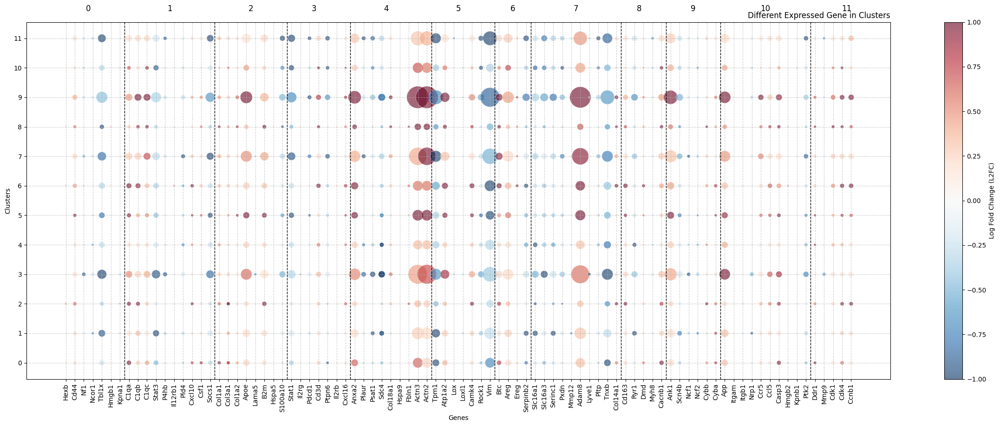

In [111]:
gene_lists = {
    '0': ['Hexb', 'Cd44', 'Nf1', 'Ncor1', 'Tbl1x', 'Hmgb1', 'Kpna1'],
    '1': ['C1qa', 'C1qb', 'C1qc', 'Stat3', 'P4hb', 'Il12rb1', 'Pld4', 'Cxcl10', 'Csf1', 'Socs1'],
    '2': ['Col1a1', 'Col3a1', 'Col1a2', 'Apoe', 'Lama5', 'B2m', 'Hspa5', 'S100a10'],
    '3': ['Stat1', 'Il2rg', 'Pdcd1', 'Cd3d', 'Ptpn6', 'Il2rb', 'Cxcl16'],
    '4': ['Anxa2', 'Plaur', 'Psat1', 'Lama5', 'Sdc4', 'Col18a1', 'Sdc4', 'Hspa9', 'Fbln1'],
    '5': ['Actn3', 'Actn2', 'Tpm1', 'Atp1a2', 'Col3a1', 'Lox', 'Loxl1'],
    '6': ['Camk4', 'Kpna1', 'Rock1', 'Vim'],
    '7': ['Btc', 'Areg', 'Ereg', 'Serpinb2', 'Slc16a1', 'Slc16a3', 'Serinc1', 'Pxdn', 'Mmp12', 'Adam8'],
    '8': ['Lyve1', 'Pltp', 'Tnxb', 'Col14a1', 'Cd163'],
    '9': ['Ryr1', 'Dmd', 'Myh8', 'Cacnb1', 'Ank1', 'Scn4b'],
    '10': ['Ncf1', 'Ncf2', 'Cybb', 'Cyba', 'App', 'Itgam', 'Itgb1', 'Nrp1', 'Ccr5', 'Ccl5'],
    '11': ['Casp3', 'Hmgb2', 'Kpnb1', 'Ptk2', 'Ddr1', 'Mmp9', 'Cdk1', 'Cdk4', 'Ccnb1']
}

all_genes = [gene for sublist in gene_lists.values() for gene in sublist]
available_genes = [gene for gene in all_genes if gene in fdata.var_names]

# 创建用于绘图的数据结构
data = []
for cluster, genes in gene_lists.items():
    for gene in genes:
        if gene in available_genes:
            idx = list(fdata.var_names).index(gene)
            for group in fdata.uns['rank_genes_groups']['names'].dtype.names:
                gene_names = fdata.uns['rank_genes_groups']['names'][group]
                pval = fdata.uns['rank_genes_groups']['pvals'][group][idx]
                logfoldchange = fdata.uns['rank_genes_groups']['logfoldchanges'][group][idx]
                if gene in gene_names:
                    data.append({
                        'gene': gene,
                        'cluster': group,
                        'pval': pval,
                        'logfoldchange': logfoldchange
                    })

# 转换为DataFrame
df = pd.DataFrame(data)

# 绘制自定义气泡图
fig, ax = plt.subplots(figsize=(30, 10))

# 绘制气泡
scatter = ax.scatter(
    x=df['gene'],
    y=df['cluster'],
    s=-np.log10(df['pval']) * 25,  # 气泡大小代表 p 值（-log10 变换）
    c=df['logfoldchange'],  # 颜色代表 L2FC
    cmap='RdBu_r',
    alpha=0.6,
    edgecolors='w',
    linewidth=0.5,
    vmax=1,
    vmin=-1
)

# 添加颜色条
cbar = plt.colorbar(scatter)
cbar.set_label('Log Fold Change (L2FC)')

# 设置标签和标题
ax.set_xlabel('Genes')
ax.set_ylabel('Clusters')
ax.title.set_position([2.5, 0])
ax.set_title('Different Expressed Gene in Clusters', loc="right")

# 调整x轴标签
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.6)

x_positions = [df[df['gene'] == genes[0]].index[0] / 12 - 0.5 for genes in gene_lists.values()][1:]
for pos in x_positions:
    ax.axvline(pos, color='black', linestyle='--', linewidth=1)

cnt = 0
for cluster_id, genes in gene_lists.items():
    mid = cnt + len(genes) // 2 - 0.5
    cnt += len(genes)
    ax.text(
        mid, 12, cluster_id, ha='center', va='center', fontsize=12,
        bbox=dict(facecolor='white', alpha=0.5, edgecolor='none')
    )

plt.show()

In [8]:
!sshpass -p wang2024 ssh wpy@172.16.10.103 "mamba run -n gsea python ~/stereoseq/20240502-SPACseq/enrich.py"

Gene               object
Log2FoldChange    float64
padj              float64
score             float64
Cluster             int64
dtype: object
/home/wpy/stereoseq/20240502-SPACseq/bin/go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
Error in enrichment analysis for list 0: list index out of range
Error in enrichment analysis for list 1: list index out of range
Error in enrichment analysis for list 2: list index out of range
Error in enrichment analysis for list 3: list index out of range
Error in enrichment analysis for list 4: list index out of range
Error in enrichment analysis for list 5: list index out of range
Error in enrichment analysis for list 6: list index out of range
Error in enrichment analysis for list 7: list index out of range
Error in enrichment analysis for list 8: list index out of range
Error in enrichment analysis for list 9: list index out of range
Error in enrichment analysis for list 10: list index out of range
Error in enrichment analysis for list 11: list 

In [ ]:
for i in range(12):
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False)
    results = results[results["Combined Score"] > 50]
    results[["Name", "ID"]] = results["Term"].str.extract(r'(.+?) \((GO:\d+)\)')
    results = results.iloc[:, [-1, -2, -3, -4]]
    results["Cluster"] = i
    if not i: go_df = results
    else: go_df = pd.concat([go_df, results], axis=0)
go_df

In [ ]:
clusters = np.unique(go_df["Cluster"])
fig = plt.figure(figsize=(8, len(clusters) * 4))
for i in range(len(clusters)):
    ax = plt.subplot(len(clusters), 1, i+1)
    plt.title(f"{clusters[i]}", loc="left")
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False).head(20)

    ax.barh(results['Term'], results['Combined Score'], color='skyblue')

    plt.gca().invert_yaxis()